# Installing Necessary Libraries for this Notebook

In [1]:
!pip install tqdm numpy matplotlib jupyter imageio[ffmpeg] open3d osmnx osmium


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# Dataset Installation Notes
In order to download the dataset, go to this [website](https://www.cs.cmu.edu/~vmr/datasets/oakland_3d/cvpr09/doc/) and download the complete dataset. Unzip the zip file and put the `original` folder in the same directory/folder as this jupyter notebook.

# Importing Libraries

In [1]:
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, Image
import os
from tqdm import tqdm
import imageio.v2 

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
from src.preprocessing import *
from src.sensor import Sensor
from src.tracker import Tracker
from src.plotting import *

In [3]:
import warnings
warnings.filterwarnings("ignore")

# 3D Visualization of data

In [4]:
# Function to visualize point cloud data with colored points
def visualize_point_cloud_with_colors(points, colors):
    # Create Open3D point cloud object
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    pcd.colors = o3d.utility.Vector3dVector(colors)

    # Visualize
    o3d.visualization.draw_geometries([pcd])

In [5]:
# Different sections of the dataset
all_file_paths = ["original/"+i for i in os.listdir('original/')[1:-2]]

section_1 = [
 'original/oakland_part3_aj.xyz_label_conf',
 'original/oakland_part3_ak.xyz_label_conf',
 'original/oakland_part3_al.xyz_label_conf',
 'original/oakland_part3_am.xyz_label_conf']

In [6]:
# File path to the dataset file (adjust as needed)
file_paths = section_1

# Camera position & target position
data_center = (195, 230, 5)
camera_position = (15, 210, 0)

# Load the point cloud data and labels and colors
points, labels = load_multiple_oakland_files(file_paths)
colors = label_to_color(labels)

# Creating points and colors to plots (we add camera and datacenter)
plot_points = np.append(points, [data_center, camera_position], axis=0)
plot_labels = np.append(labels, [0,0])
plot_colors = label_to_color(plot_labels)

# Visualize the point cloud with colored points
visualize_point_cloud_with_colors(plot_points, plot_colors)

# Camera Pinhole sensor model 

In [7]:
# Creating the sensor
s = Sensor(points, colors)

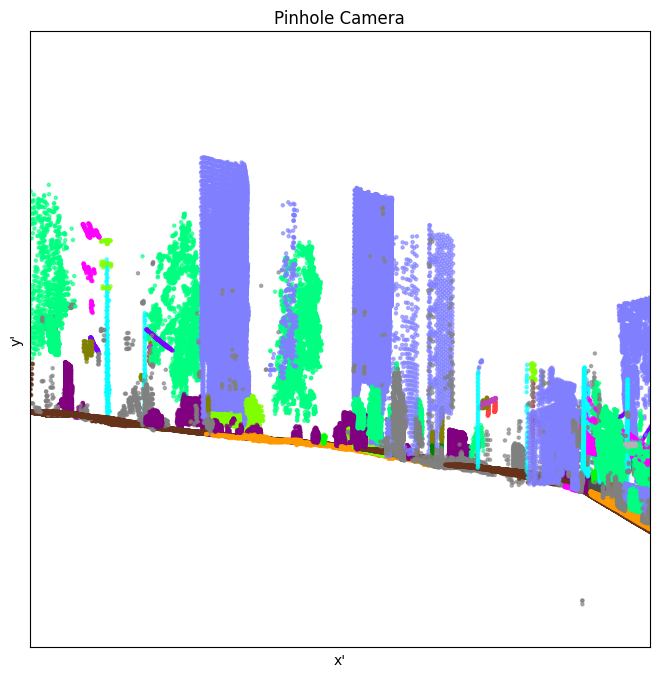

In [8]:
# Function to render the projected 2D view
fig, ax = render_pinhole_projection(s, camera_position, data_center)

#### Interactive Sliders 

In [9]:
def interactive_render(sensor, points, labels, render_function):
    """
    Creates an interactive 3D rendering interface with sliders to control 
    camera parameters (focal length, height, and angle)

    Parameters:
    - sensor (object): The sensor object instantiated with data. 
    - points (ndarray): A 2D array of shape (N, 3), representing the 3D coordinates of points to render.
    - labels (ndarray): A 1D array of shape (N,), containing labels for the points.
    - render_function (function): A function that renders the scene, like render_pinhole_projection or 
    render_pixelated_pinhole_projection
    """

    # Define sliders
    focal_slider = widgets.FloatSlider(value=1, min=.5, max=5, step=.01, description='Focal')
    height_slider = widgets.FloatSlider(value=20, min=0, max=150, step=1, description='Height')
    angle_slider = widgets.FloatSlider(value=-3, min=-1.1-np.pi,  max=-1.1, step=.01, description='Angle')

    # Link sliders to the rendering function
    ui = widgets.VBox([focal_slider, height_slider, angle_slider])
    
    def update_view(focal_length, height, angle):
        temp_camera_position =  (data_center[0]+np.cos(angle)*200, data_center[1]+np.sin(angle)*200, height)
        render_function(sensor, temp_camera_position, data_center, focal_length)
    
    out = widgets.interactive_output(update_view, {'focal_length': focal_slider, 'height':height_slider, 'angle': angle_slider})
    
    display(ui, out)    

In [10]:
# Widget which moves the camera up-down, around the datacenter, and allow to zoom in and out to display the point cloud
interactive_render(s, points, labels, render_pinhole_projection)

Output()

#### Generating videos 

In [11]:
# Given a list of camera position and focal lengths -> output frames following the specs
def generate_frames_from_camera_specs(camera_positions, focal_lengths, output_name):
    # Output directory for frames
    output_dir = 'frames'
    os.makedirs(output_dir, exist_ok=True)
    frame_paths = []
    
    # Generate frames and save as images    
    for i in tqdm(range(len(camera_positions))):
        fig, ax = render_pinhole_projection(s, camera_positions[i], data_center, focal_lengths[i])
        
        # Save the frame as an image
        filepath = os.path.join(output_dir, f'frame_{output_name}_{i:03d}.png')
        fig.savefig(filepath)
        frame_paths.append(filepath)

        plt.close(fig) # Close figure
        
    return frame_paths

# Given the frames generated in the previous functions, generate the video
def create_video_from_frames(frame_paths, output_name):
    # Combine frames into a video
    video_path = f'{output_name}_video.mp4'
    with imageio.get_writer(video_path, fps=18) as writer:
        for image_path in frame_paths:
            image = imageio.imread(image_path)
            writer.append_data(image)

    print(f"Video saved at {video_path}")

In [13]:
# Moving camera up-down video
output_name = "up_down"
camera_positions = [camera_position+np.array([0,0,h]) for h in range(100)]
focal_lengths = [1] * len(camera_positions)

frame_paths = generate_frames_from_camera_specs(camera_positions, focal_lengths, output_name)
create_video_from_frames(frame_paths, output_name)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [04:58<00:00,  2.99s/it]


Video saved at up_down_video.mp4


In [14]:
# Moving around cluster video
output_name = "circling"
camera_positions = [(data_center[0]+np.cos(angle/100)*200, data_center[1]+np.sin(angle/100)*200, 10) for angle in range(-424, -11, 4)]
focal_lengths = [1] * len(camera_positions)

frame_paths = generate_frames_from_camera_specs(camera_positions, focal_lengths, output_name)
create_video_from_frames(frame_paths, output_name)

100%|████████████████████████████████████████████████████████████████████████████████| 104/104 [05:10<00:00,  2.99s/it]


Video saved at circling_video.mp4


In [15]:
# Zooming in and out video
output_name = "zooming"
focal_lengths = [fl/100 for fl in range(1, 100)]+[fl/10 for fl in range(10, 50)]
camera_positions = [camera_position] * len(focal_lengths)

frame_paths = generate_frames_from_camera_specs(camera_positions, focal_lengths, output_name)
create_video_from_frames(frame_paths, output_name)

100%|████████████████████████████████████████████████████████████████████████████████| 139/139 [06:44<00:00,  2.91s/it]


Video saved at zooming_video.mp4


# Pixelating Pinhole Projection

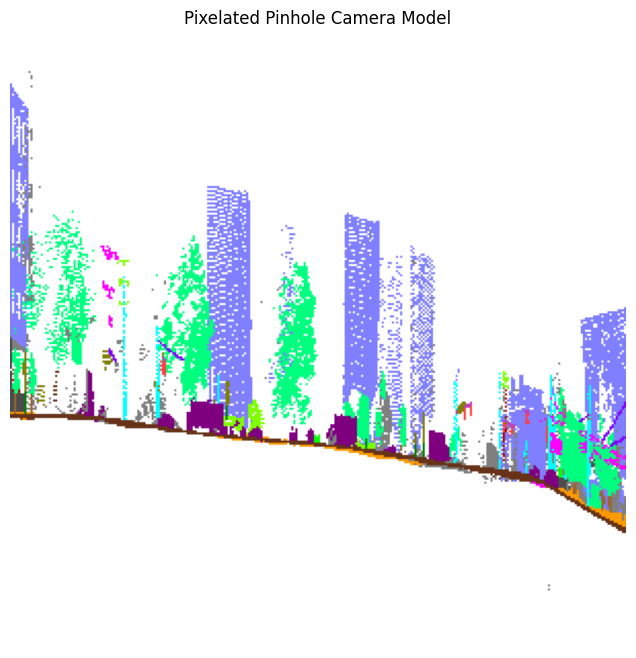

In [16]:
render_pixelated_pinhole_projection(s, camera_position, data_center, focal_length=0.9)

In [17]:
interactive_render(s, points, labels, render_pixelated_pinhole_projection)

Output()

# Depth sensor modeling

Ideal Depth Sensor


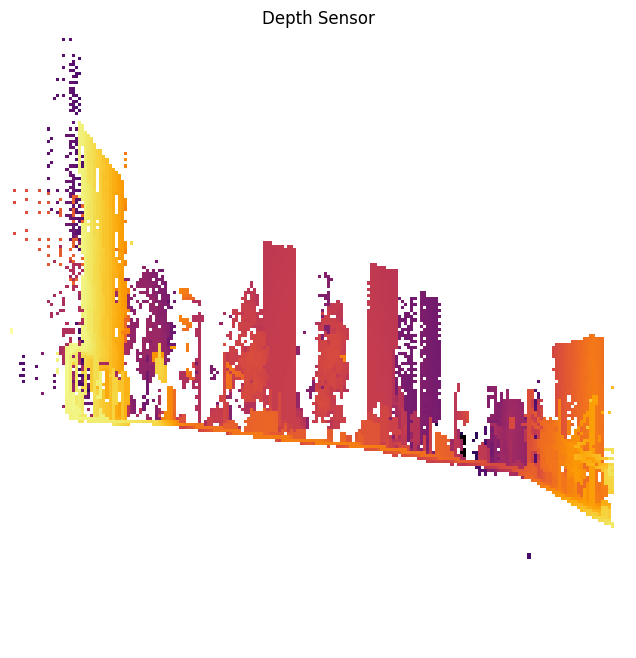

In [18]:
# Ligter colors are closer to us and darker colors are further
print("Ideal Depth Sensor")
fig, ax = render_depth_sensor(s, camera_position, data_center, focal_length=.7, sensor_type="ideal")

Noisy Depth Sensor


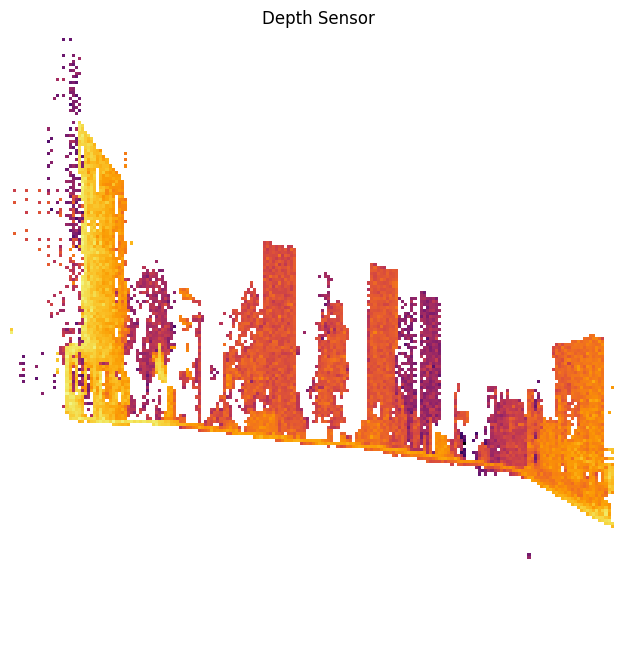

In [19]:
print("Noisy Depth Sensor")
fig, ax = render_depth_sensor(s, camera_position, data_center, focal_length=.7, sensor_type="noisy")

Blurry Depth Sensor


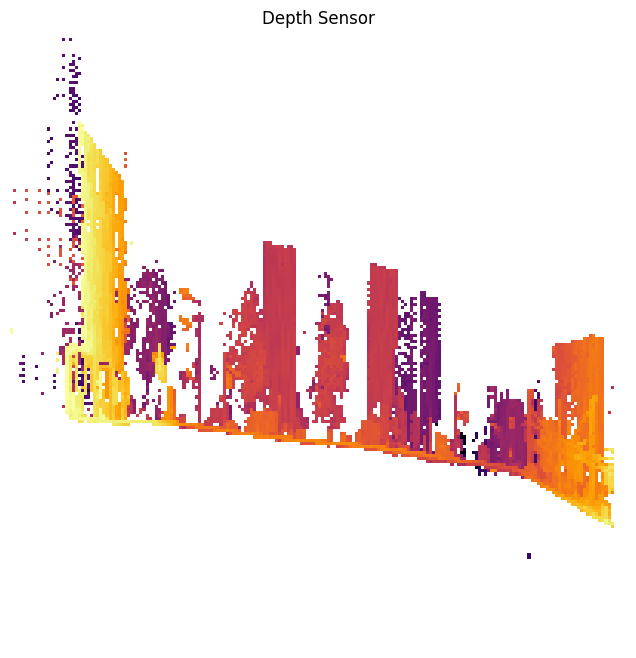

In [20]:
print("Blurry Depth Sensor")
fig, ax = render_depth_sensor(s, camera_position, data_center, focal_length=.7, sensor_type="blurry")

In [21]:
interactive_render(s, points, labels, render_depth_sensor)

Output()

# Tracking Depth Sensor

In [22]:
# In this cell, we set up the target coordinates
step_size = 1
n1 = np.array((130, 330, 6))
n2 = np.array((160, 340, 7))
n3 = np.array((225, 205, 3))
n4 = np.array((180, 175, 0))

# Generates an array of interpolated points connecting consecutive points
def generate_interpolated_points(points, step_size=1):
    interpolated_points = []

    for i in range(len(points) - 1):
        start, end = points[i], points[i + 1]
        
        vector = end - start
        distance = np.linalg.norm(vector)
        
        # Compute the number of points to interpolate
        num_points = int(distance // step_size) + 1
        step_vector = (vector / np.linalg.norm(vector)) * step_size
        
        # Generate points along the segment
        segment_points = [start + step_vector * j for j in range(num_points)]
        interpolated_points.extend(segment_points)
    
    interpolated_points.append(points[-1])
    
    return np.array(interpolated_points)

target_path = generate_interpolated_points([n1,n2,n3,n4], step_size)

In [23]:
# Simulate tracking using target coordinates generated previously
drone_tracker = Tracker(
    sensor = s,
    step_size = step_size,
    propagation_factor = 0.05,
    add_noise = True,
    apply_blur = True,
    height_adjustment = 10
)

drone_path, drone_view_target_path = drone_tracker.track(target_path, n1+2*(n1-n2))

238it [00:06, 34.57it/s]


In [24]:
# Visualizing the drone's and target's path 
plot_points = np.append(points, drone_view_target_path+drone_path, axis=0)
plot_labels = np.append(labels, [1000]*len(drone_view_target_path) + [0]*len(drone_path))
plot_colors = label_to_color(plot_labels)

# Drone path is in red and the target path is in black
visualize_point_cloud_with_colors(plot_points, plot_colors)

In [36]:
def varying_camera_position_frames(camera_positions, target_positions, output_name, sensor_type):
    # Output directory for frames
    output_dir = 'frames'
    os.makedirs(output_dir, exist_ok=True)
    frame_paths = []

    # Iterate through all camera/target positions
    for i in tqdm(range(len(camera_positions))):
        fig, ax = render_depth_sensor(
            s, 
            camera_positions[i], 
            target_positions[i], 
            focal_length=1.0, 
            sensor_type=sensor_type,
            plot_target= True
        )
    
        # Save the frame as an image
        filepath = os.path.join(output_dir, f'frame_{output_name}_{i:03d}.png')
        fig.savefig(filepath)
        frame_paths.append(filepath)

        plt.close(fig)
        
    return frame_paths

# Given the frames generated in the previous functions, generate the GIF
def create_gif_from_frames(frame_paths, output_name, duration=0.1):
    # Combine frames into a GIF
    gif_output_path = f"{output_name}.gif"
    with imageio.get_writer(gif_output_path, mode='I', duration=duration, loop=0) as writer:
        for frame_path in tqdm(frame_paths, desc="Creating GIF"):
            image = imageio.imread(frame_path)
            writer.append_data(image)
    print(f"GIF saved at: {gif_output_path}")

# Generating frames and video from the paths
sensor_type = "blurry"
output_name = f"tracking_{sensor_type}"
frame_paths = varying_camera_position_frames(drone_path, drone_view_target_path, output_name, sensor_type)
create_gif_from_frames(frame_paths, output_name, duration=0.06)

Creating GIF: 100%|██████████████████████████████████████████████████████████████████| 238/238 [00:03<00:00, 64.42it/s]


GIF saved at: tracking_blurry.gif


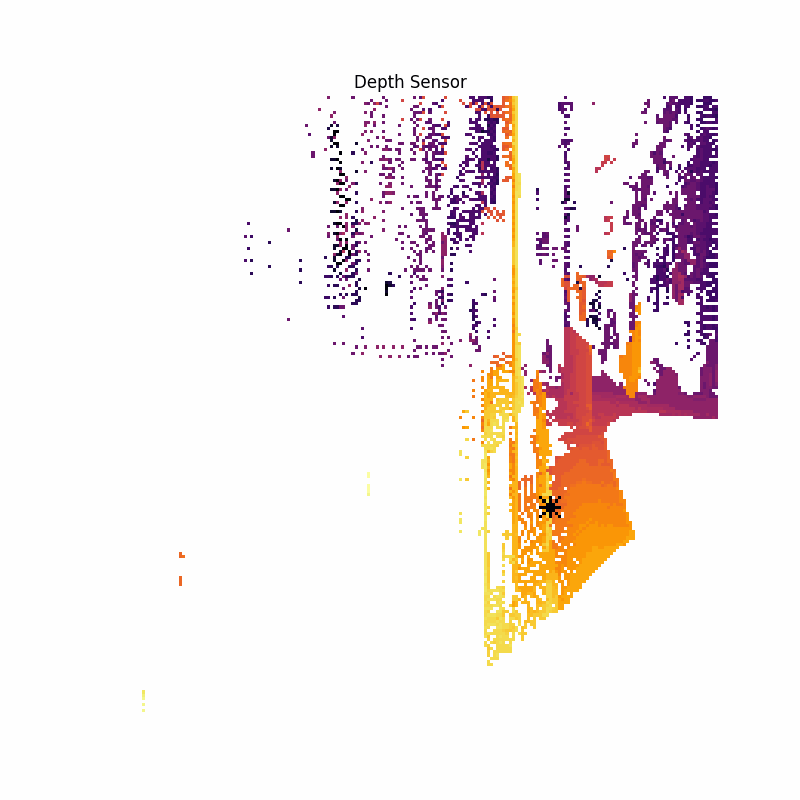

In [3]:
# Display GIF in the notebook
gif_path = f"{output_name}.gif"
display(Image(filename=gif_path, width=600))